## Changes in Resting-State EEG Aperiodic 1/f Activity, Individual Alpha Frequency and Power, and Episodic Memory Performance in Healthy Adolescents and Older Adults

Created by Toomas Erik Anijärv in 16.12.2022

This notebook is a representation of EEG processing done for the publication with pre-processing shown with one participant, spectral analysis with two participants and final results (data visualisation) with the full dataset.

You are free to use this or any other code from this repository for your own projects and publications. Citation or reference to the repository is not required, but would be much appreciated (see more on README.md).

In [4]:
import mne, os
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
from fooof import FOOOF
from fooof.plts.spectra import plot_spectrum
from fooof.plts.aperiodic import plot_aperiodic_params, plot_aperiodic_fits
from fooof.plts.periodic import plot_peak_params

# Set the current working directory to be the project main folder
os.chdir('/Users/tanijarv/Documents/GitHub/EEG-pipeline-TI')
plt.rc('axes', axisbelow=True)

import basic.arrange_data as arrange
import signal_processing.pre_process as pre_process
import signal_processing.spectral_analysis as spectr

### PRE-PROCESSING

**Locating the EEG files in folders** by define the experiment sub-folder (`exp_folder`), folder with raw EEG files (`raw_folder`), folder for exporting clean EEG files (`clean_folder`), and folder for exporting the results (`results_folder`).

During pre-processing, all the raw EEG files are cleaned from the `raw_folder/exp_folder` and later saved to `clean_folder/exp_folder`. For analysis, the same clean files are read in and worked on until the results are exported to `results_folder/exp_folder`.

In [174]:
### DEFINE ###
raw_folder = 'Data/Raw/'
clean_folder = 'Data/Clean/'

exp_folder = 'LEISURE/Eyes Closed/T1'
exp_condition = 'EC_T1'

**Pre-processing** within this study includes initially reading the raw EEG files from `raw_folder/exp_folder`, setting montage (`biosemi32`), re-referencing the signals to `mastoid`, cropping the EEG signal to include only the `resting` part.

Furthermore, `0.5-30 Hz FIR filter` is designed (`zero-phase, Hamming window, order 6578`) and EOG channels are used to remove EOG-related noise with `signal-space projections (SSP)` as method.

Finally, artefacts are rejected with Autoreject package by removing epochs which exceed the global thereshold voltage level (`global AR`) and rest of the artefactual epochs are either removed or interpreted with `local AR`.

The clean EEG signals are exported to `clean_folder/exp_folder`.

In [175]:
### DEFINE ###
montage = 'biosemi32'
eog_channels = ['EXG1', 'EXG2', 'EXG3', 'EXG4', 'EXG5', 'EXG6', 'EXG7', 'EXG8'] # EOG channels + mastoids
stimulus_channel = 'Status'
reference = 'average' # average as reference
epochs_duration = 5
filter_design = dict(l_freq=0.5,h_freq=30,filter_length='auto',method='fir',
                     l_trans_bandwidth='auto',h_trans_bandwidth='auto',
                     phase='zero',fir_window='hamming',fir_design='firwin')

# Set the directory in progress and find all BDF (raw EEG) files in there
dir_inprogress = os.path.join(raw_folder,exp_folder)
export_dir = os.path.join(clean_folder,exp_folder)
file_dirs, subject_names = arrange.read_files(dir_inprogress,'.bdf')

Files in Data/Raw/LEISURE/Eyes Closed/T1-one_sample read in: 1


Extracting EDF parameters from /Users/tanijarv/Documents/GitHub/EEG-pipeline-TI/Data/Raw/LEISURE/Eyes Closed/T1-one_sample/HBA_0005_EC_T1.bdf...
BDF file detected
Setting channel info structure...
Creating raw.info structure...
Reading 0 ... 320511  =      0.000 ...   312.999 secs...
EEG channel type selected for re-referencing
Applying average reference.
Applying a custom ('EEG',) reference.
Trigger channel has a non-zero initial value of 65536 (consider using initial_event=True to detect this event)
Removing orphaned offset at the beginning of the file.
3 events found
Event IDs: [1 2 8]
Event markers are following:
[[ 64380      0      1]
 [ 64482      0      8]
 [310153      0      2]]
Starting point: 62.87109375 s
Ending point: 302.8837890625 s
Total duration: 240.0126953125 s
---
APPLYING FILTER

Filtering raw data in 1 contiguous segment
Setting up band-pass filter from 0.5 - 30 Hz

FIR filter parameters
---------------------
Designing a one-pass, zero-phase, non-causal bandpass 

[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   2 out of   2 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   3 out of   3 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   4 out of   4 | elapsed:    0.0s remaining:    0.0s


---
APPLYING SSP FOR EOG-REMOVAL

Running EOG SSP computation
Using EOG channels: EXG1, EXG2, EXG3, EXG4, EXG5, EXG6, EXG7, EXG8
EOG channel index for this subject is: [32 33 34 35 36 37 38 39]
Filtering the data to remove DC offset to help distinguish blinks from saccades


[Parallel(n_jobs=1)]: Done  32 out of  32 | elapsed:    0.2s finished


Setting up band-pass filter from 1 - 10 Hz

FIR filter parameters
---------------------
Designing a two-pass forward and reverse, zero-phase, non-causal bandpass filter:
- Windowed frequency-domain design (firwin2) method
- Hann window
- Lower passband edge: 1.00
- Lower transition bandwidth: 0.50 Hz (-12 dB cutoff frequency: 0.75 Hz)
- Upper passband edge: 10.00 Hz
- Upper transition bandwidth: 0.50 Hz (-12 dB cutoff frequency: 10.25 Hz)
- Filter length: 10240 samples (10.000 sec)

Now detecting blinks and generating corresponding events
Found 9 significant peaks
Number of EOG events detected: 9
Computing projector
Filtering raw data in 1 contiguous segment
Setting up band-pass filter from 1 - 35 Hz

FIR filter parameters
---------------------
Designing a two-pass forward and reverse, zero-phase, non-causal bandpass filter:
- Windowed frequency-domain design (firwin2) method
- Hamming window
- Lower passband edge: 1.00
- Lower transition bandwidth: 0.50 Hz (-12 dB cutoff frequency: 0.

[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   2 out of   2 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   3 out of   3 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   4 out of   4 | elapsed:    0.0s remaining:    0.0s


Not setting metadata
9 matching events found
No baseline correction applied
0 projection items activated
Using data from preloaded Raw for 9 events and 411 original time points ...
0 bad epochs dropped
Adding projection: eeg--0.200-0.200-PCA-01
Done.
1 projection items deactivated
Created an SSP operator (subspace dimension = 1)
1 projection items activated
SSP projectors applied...
---
DIVIDING INTO EPOCHS

Not setting metadata
48 matching events found
No baseline correction applied
Created an SSP operator (subspace dimension = 1)
1 projection items activated
Using data from preloaded Raw for 48 events and 5120 original time points ...
0 bad epochs dropped


[Parallel(n_jobs=1)]: Done  40 out of  40 | elapsed:    0.4s finished


---
EPOCHS BEFORE AR



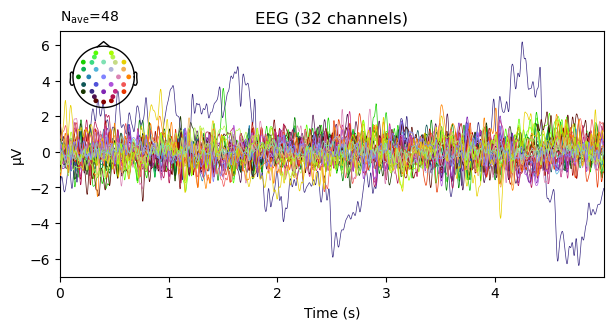

Not setting metadata
48 matching events found
No baseline correction applied
0 projection items activated
combining channels using "gfp"


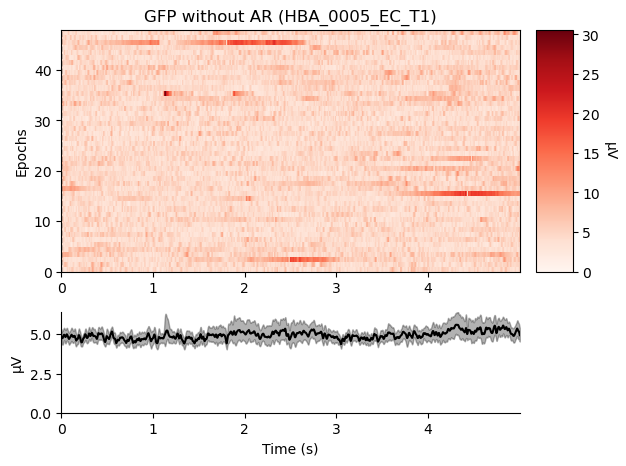

---
APPLYING GLOBAL AR

Estimating rejection dictionary for eeg
Dropping epochs with rejection threshold: {'eeg': 9.629392739606295e-05}
    Rejecting  epoch based on EEG : ['P3']
    Rejecting  epoch based on EEG : ['P3']
    Rejecting  epoch based on EEG : ['P3']
    Rejecting  epoch based on EEG : ['P3']
    Rejecting  epoch based on EEG : ['P3']
    Rejecting  epoch based on EEG : ['P3']
6 bad epochs dropped
---
APPLYING LOCAL AR

Running autoreject on ch_type=eeg


  0%|          | Creating augmented epochs : 0/32 [00:00<?,       ?it/s]

  0%|          | Computing thresholds ... : 0/32 [00:00<?,       ?it/s]

  0%|          | Repairing epochs : 0/42 [00:00<?,       ?it/s]

  0%|          | n_interp : 0/3 [00:00<?,       ?it/s]

  0%|          | Repairing epochs : 0/42 [00:00<?,       ?it/s]

  0%|          | Fold : 0/10 [00:00<?,       ?it/s]

  0%|          | Repairing epochs : 0/42 [00:00<?,       ?it/s]

  0%|          | Fold : 0/10 [00:00<?,       ?it/s]

  0%|          | Repairing epochs : 0/42 [00:00<?,       ?it/s]

  0%|          | Fold : 0/10 [00:00<?,       ?it/s]





Estimated consensus=1.00 and n_interpolate=31


  0%|          | Repairing epochs : 0/42 [00:00<?,       ?it/s]

No bad epochs were found for your data. Returning a copy of the data you wanted to clean. Interpolation may have been done.


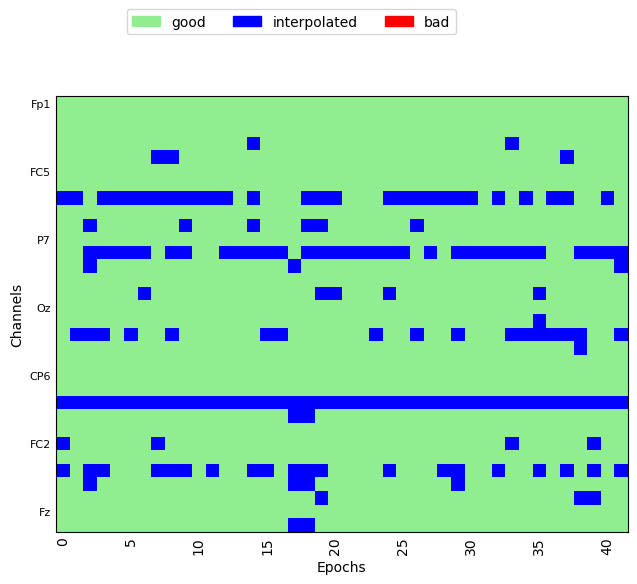

---
EPOCHS AFTER AR



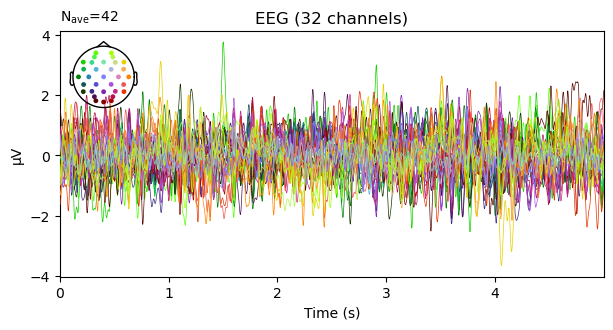

Not setting metadata
42 matching events found
No baseline correction applied
0 projection items activated
combining channels using "gfp"


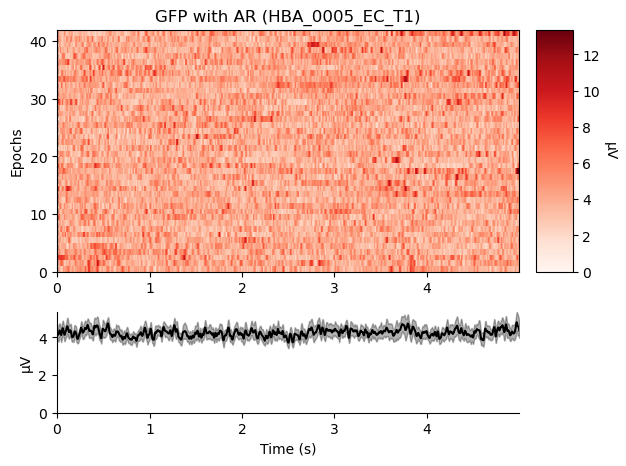

In [176]:
for i in range(len(file_dirs)):
    # Read in the raw EEG data
    raw = mne.io.read_raw_bdf(file_dirs[i], infer_types=True, eog=eog_channels,
                              stim_channel=stimulus_channel)

    # Set the right montage (Biosemi32) and set reference as average across all channels
    raw = raw.set_montage(mne.channels.make_standard_montage(montage)).load_data()\
             .set_eeg_reference(ref_channels=reference, verbose=True)

    # Find event markers for the start and end of resting state recordings
    events = mne.find_events(raw, stim_channel=stimulus_channel, consecutive=False, output='offset')
    tminmax = [events[0][0]/raw.info['sfreq'], events[-1][0]/raw.info['sfreq']]

    # Use the markers to crop to EEG signal to leave only the actual resting state
    cropped_raw = raw.crop(tmin=tminmax[0], tmax=tminmax[1])
    cropped_raw = cropped_raw.drop_channels(stimulus_channel)
    print(('Event markers are following:\n{}\nStarting point: {} s\nEnding point: {} s\n'
           'Total duration: {} s').format(events, tminmax[0], tminmax[1], tminmax[1]-tminmax[0]))
    
    # Filter the signal with bandpass filter and remove EOG artefacts with SSP
    filt = pre_process.filter_raw_data(cropped_raw, filter_design, line_remove=None,
                                       eog_channels=eog_channels, plot_filt=False, savefig=False)

    # Divide the filtered signal to epochs and run Autoreject artefact rejection on the epochs
    %matplotlib inline
    epochs = pre_process.artefact_rejection(filt,subject_names[i],epo_duration=epochs_duration)

    # (Optional) for displaying interactive EEG plots to visually inspect the signal quality
    #%matplotlib qt
    #epochs.plot(n_channels=32,n_epochs=1)

    # Try to create a directory and save the EEG file to that directory
    try:
        os.makedirs(export_dir)
    except FileExistsError:
        pass
    try:
        mne.Epochs.save(epochs,fname='{}/{}_clean-epo.fif'.format(export_dir,subject_names[i]),
                                                                  overwrite=True)
    except FileExistsError:
        pass

### SPECTRAL ANALYSIS

**Locating the EEG files in folders** by defining the experiment sub-folders (`exp_folder`), folder with clean EEG files (`clean_folder`), and folder for exporting the results (`results_folder`).

During spectral analysis, all the clean EEG files are analysed and exported to `results_folder/exp_folder`.

In [5]:
### DEFINE ###
clean_folder = 'Data/Clean/'
results_folder = 'Results/'

exp_folder = ['LABS-LEISURE/Eyes Closed/LEISURE', 'LABS-LEISURE/Eyes Closed/LABS']
exp_condition = ['LEISURE', 'LABS']

**Spectral analysis** within this study includes estimating `Welch's power spectrum density (PSD)` for all the participants at five brain regions (i.e., `frontal`, `parietal`, `left-temporal`, `right-temporal` and `occipital`). The PSDs are fitted with `specparam` (`FOOOF`) model to estimate aperiodic 1/f-like component in the spectra which can be described with parameters `exponent` and `offset`. After that, the spectrum is flattened by substracting aperiodic component from the spectrum and within the given alpha band (`7-14 Hz`), a maximum power value, i.e. peak, is detected and its amplitude (i.e. `alpha power width`) and frequency (i.e. `alpha center frequency`) are exported. Finally, `absolute alpha band power` is calculated from the flattened spectrum by averaging PSD estimate within the center frequency and its bandwidth of 6 Hz (e.g., CF=10.4Hz -> alpha band=7.4-13.4Hz) and `relative alpha band power` is calculated by dividing the absolute band power by the broadband power (i.e., average PSD across all spectrum).

Welch's PSD is calculated for `1-30 Hz` frequency range using `2.5-second Hamming window (50% overlap)` and 39 times the window (97.5 seconds) zero-padding (for more interpolated frequency points when finding center frequency of the alpha peak).

The FOOOF (specparam) algorithm (version 1.0.0) was used to parameterize neural power spectra. Settings for the algorithm were set as: `peak width limits : 1-12 Hz`; `max number of peaks : infinite`; `minimum peak height : 0.225 uV^2`; `peak threshold : 2.0 uV^2`; and `aperiodic mode : fixed`. Power spectra were parameterized across the frequency range `1-30 Hz`. The aperiodic 1/f-like fit is described with the following function, where $S$ is aperiodic component, $b$ is `offset`, $F$ is vector of frequencies, and $e$ is `exponent`:

$S=b-log(F^e)$

The results are saved as Excel spreadsheets regionally to `results_folder/exp_folder/FOOOF`.

In [8]:
### DEFINE ###
bands = {'Alpha' : [7, 14]}
brain_regions = {'Frontal':['Fp1','Fp2','AF3','AF4','F3','F4','Fz','FC1','FC2'],
                 'Parietal':['C3','C4','Cz','CP1','CP2','P3','P4','Pz'],
                 'Left temporal':['T7','CP5','P7'],
                 'Right temporal':['T8','CP6','P8'],
                 'Occipital':['Oz','O1','O2','PO3','PO4']}
flat_spectr_scale = 'log'
plot_rich = True
savefig = False
psd_params = dict(method='welch', fminmax=[1, 30], window='hamming', window_duration=2.5,
                  window_overlap=0.5, zero_padding=39)
fooof_params = dict(peak_width_limits=[1,12], max_n_peaks=float("inf"), min_peak_height=0.225,
                    peak_threshold=2.0, aperiodic_mode='fixed')

Files in Data/Clean/LABS-LEISURE/Eyes Closed/LEISURE-one_participant read in: 1
---
PSD (welch) calculation

<Power Spectrum (from Epochs, welch method) | 42 epochs × 32 channels × 2901 freqs, 1.0-30.0 Hz>
Window type: hamming
Window size: 2560
Overlap: 1280
Zero-padding: 99840

Samples per segment: 2560
Samples for FFT: 102400
Frequency resolution: 0.010000000000000009 Hz


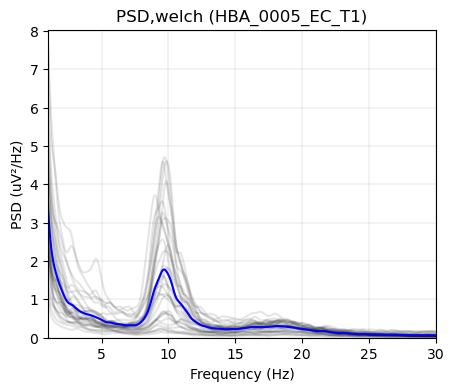

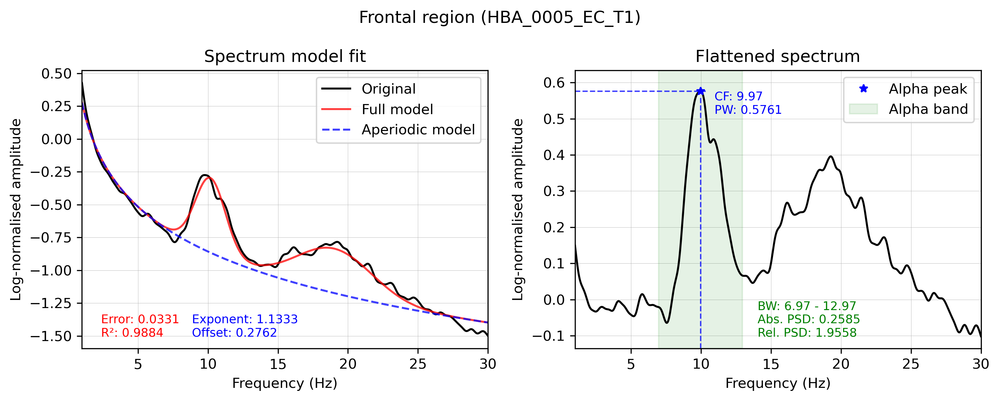

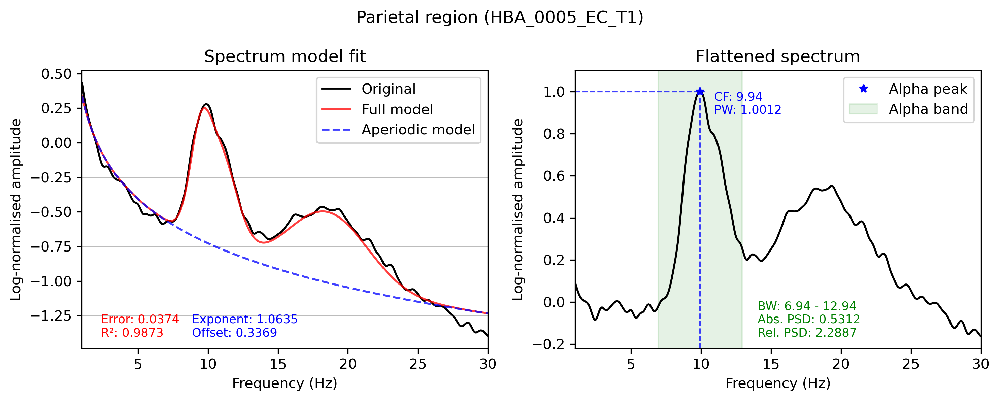

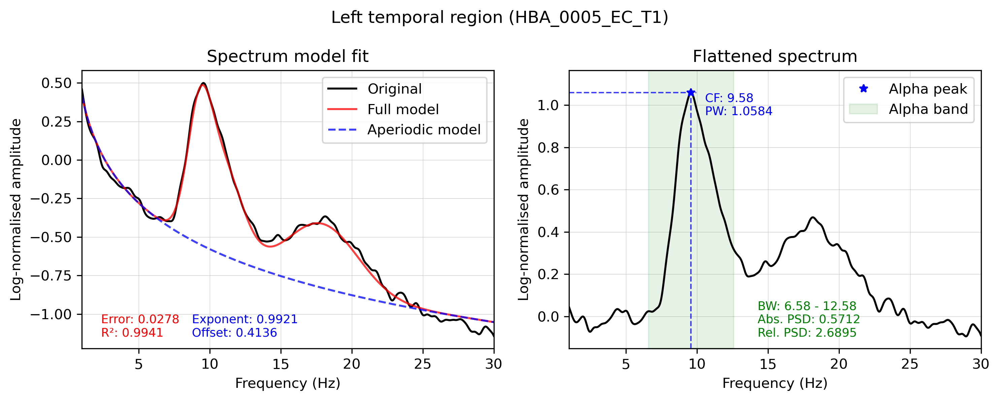

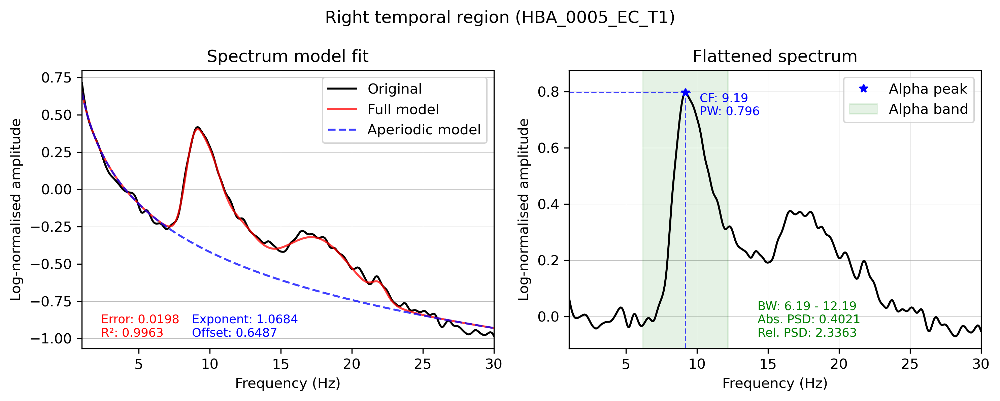

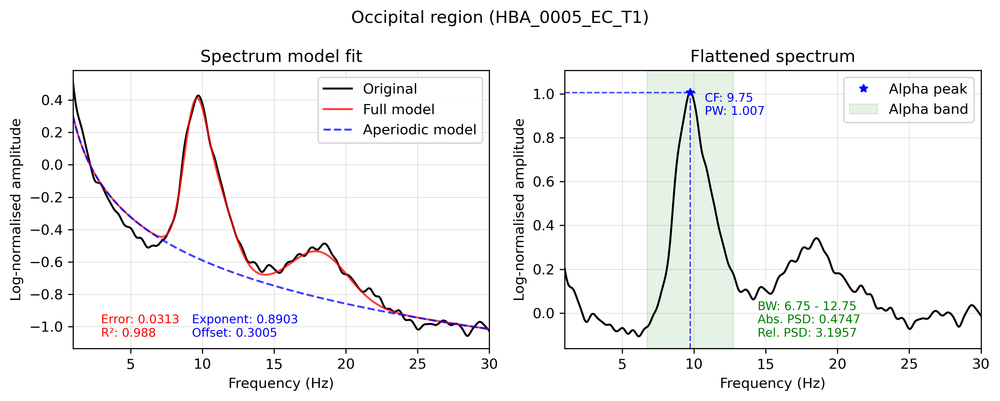

,Exponent,Offset,Alpha CF,Alpha PW,Alpha BW,Alpha absolute power,Alpha relative power,R_2,Error
HBA_0005_EC_T1,1.133271,0.276239,9.97,0.576147,"[6.97, 12.97]",0.258509,1.955801,0.988358,0.033101


,Exponent,Offset,Alpha CF,Alpha PW,Alpha BW,Alpha absolute power,Alpha relative power,R_2,Error
HBA_0005_EC_T1,1.063458,0.336863,9.94,1.001156,"[6.94, 12.94]",0.531246,2.288707,0.987281,0.037439


,Exponent,Offset,Alpha CF,Alpha PW,Alpha BW,Alpha absolute power,Alpha relative power,R_2,Error
HBA_0005_EC_T1,0.992143,0.413575,9.58,1.058421,"[6.58, 12.58]",0.571216,2.689511,0.994089,0.027795


,Exponent,Offset,Alpha CF,Alpha PW,Alpha BW,Alpha absolute power,Alpha relative power,R_2,Error
HBA_0005_EC_T1,1.068445,0.648672,9.19,0.795989,"[6.19, 12.19]",0.402136,2.336314,0.996268,0.019822


,Exponent,Offset,Alpha CF,Alpha PW,Alpha BW,Alpha absolute power,Alpha relative power,R_2,Error
HBA_0005_EC_T1,0.890286,0.300509,9.75,1.006952,"[6.75, 12.75]",0.474691,3.195687,0.987991,0.031272


Files in Data/Clean/LABS-LEISURE/Eyes Closed/LABS-one_participant read in: 1
---
PSD (welch) calculation

<Power Spectrum (from Epochs, welch method) | 48 epochs × 32 channels × 2901 freqs, 1.0-30.0 Hz>
Window type: hamming
Window size: 2560
Overlap: 1280
Zero-padding: 99840

Samples per segment: 2560
Samples for FFT: 102400
Frequency resolution: 0.010000000000000009 Hz


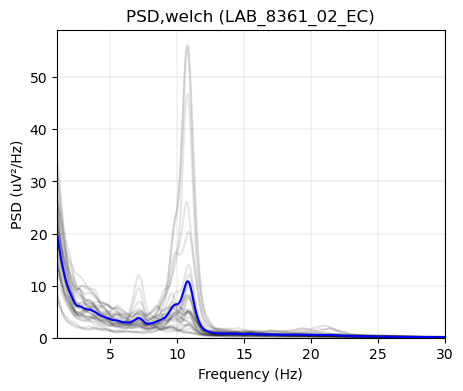

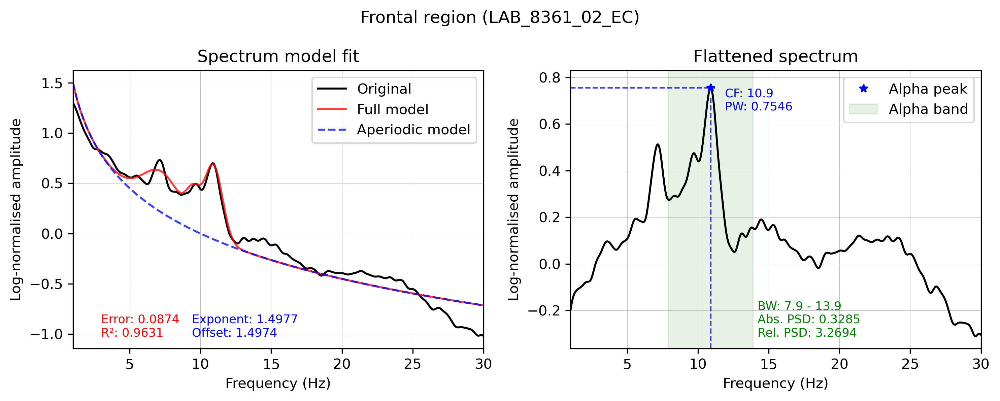

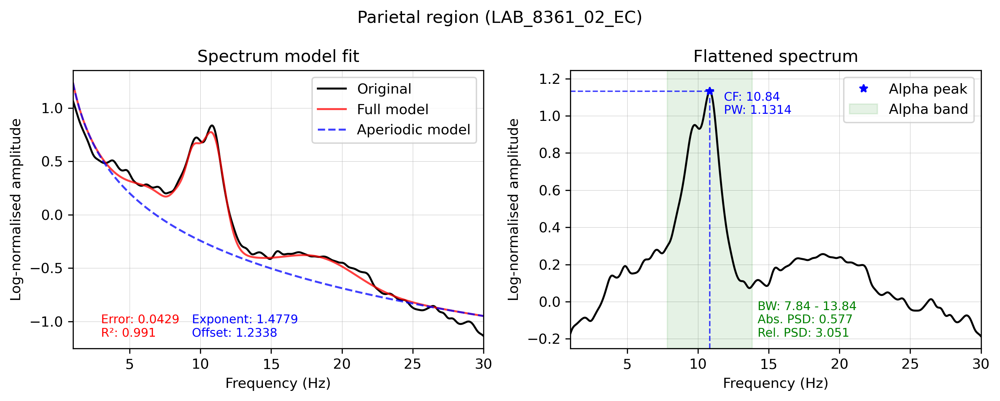

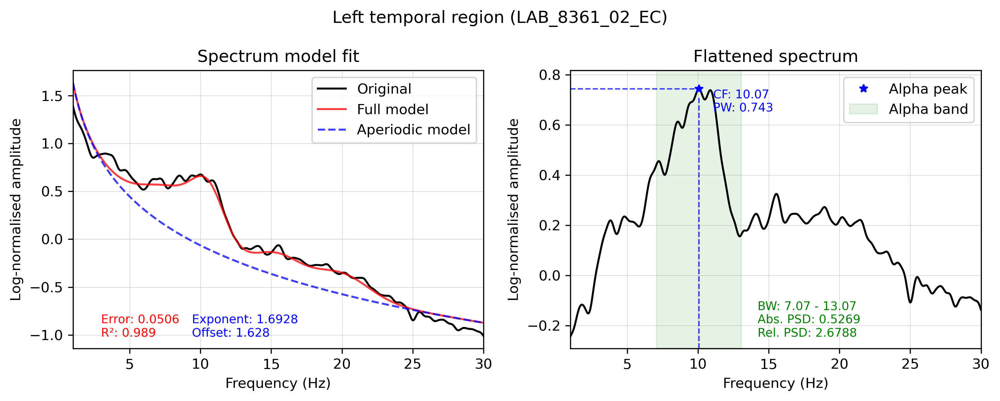

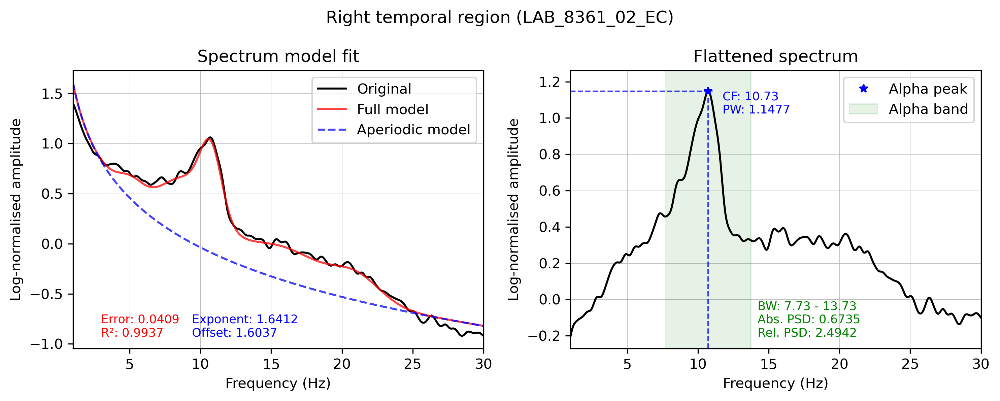

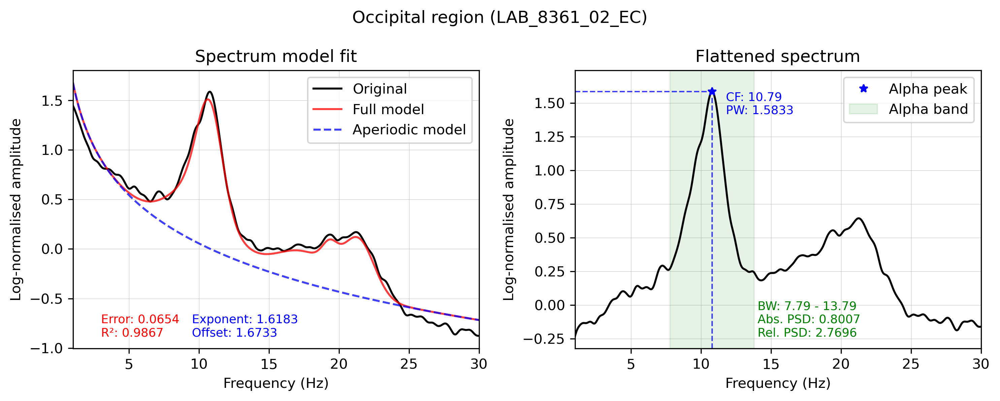

,Exponent,Offset,Alpha CF,Alpha PW,Alpha BW,Alpha absolute power,Alpha relative power,R_2,Error
LAB_8361_02_EC,1.49768,1.497443,10.9,0.754579,"[7.9, 13.9]",0.328519,3.269405,0.963084,0.087409


,Exponent,Offset,Alpha CF,Alpha PW,Alpha BW,Alpha absolute power,Alpha relative power,R_2,Error
LAB_8361_02_EC,1.477881,1.233782,10.84,1.131371,"[7.84, 13.84]",0.577018,3.050954,0.991022,0.042901


,Exponent,Offset,Alpha CF,Alpha PW,Alpha BW,Alpha absolute power,Alpha relative power,R_2,Error
LAB_8361_02_EC,1.692766,1.628032,10.07,0.743044,"[7.07, 13.07]",0.52686,2.678841,0.989019,0.050639


,Exponent,Offset,Alpha CF,Alpha PW,Alpha BW,Alpha absolute power,Alpha relative power,R_2,Error
LAB_8361_02_EC,1.641181,1.603732,10.73,1.147681,"[7.73, 13.73]",0.673478,2.494246,0.993695,0.040906


,Exponent,Offset,Alpha CF,Alpha PW,Alpha BW,Alpha absolute power,Alpha relative power,R_2,Error
LAB_8361_02_EC,1.618282,1.67333,10.79,1.583299,"[7.79, 13.79]",0.800685,2.769598,0.986687,0.065359


In [10]:
# Loop through both experiment folders
for exp in range(len(exp_folder)):
    # Set the directory in progress and find all FIF (clean EEG) files in there
    dir_inprogress = os.path.join(clean_folder, exp_folder[exp])
    file_dirs, subject_names = arrange.read_files(dir_inprogress, '_clean-epo.fif')
    arrange.create_results_folders(exp_folder=exp_folder[exp], results_folder=results_folder, fooof=True)

    for i in range(len(file_dirs)):
        # Read in the clean EEG data
        epochs = mne.read_epochs(fname='{}/{}_clean-epo.fif'.format(dir_inprogress, subject_names[i]),
                                                                    verbose=False)
        
        # Calculate Welch's power spectrum density
        [psds,freqs] = spectr.calculate_psd(epochs, subject_names[i], method=psd_params['method'],
                                            fminmax=psd_params['fminmax'], window=psd_params['window'],
                                            window_duration=psd_params['window_duration'],
                                            window_overlap=psd_params['window_overlap'],
                                            zero_padding=psd_params['zero_padding'],
                                            verbose=True, plot=True)
        
        # Average all epochs and channels together -> (freq bins,) shape
        if i == 0:
            psds_allch = np.zeros(shape=(len(file_dirs), len(freqs)))
        psds_allch[i] = psds.mean(axis=(0, 1))

        # Average all epochs together for each channel and also for each region
        psds = psds.mean(axis=(0))
        df_psds_ch = arrange.array_to_df(subject_names[i], epochs, psds).\
                             reset_index().drop(columns='Subject')
        df_psds_regions = arrange.df_channels_to_regions(df_psds_ch, brain_regions).\
                                  reset_index().drop(columns='Subject')

        # Go through all regions of interest
        for region in df_psds_regions.columns:
            if i == 0:
                globals()["df_fooof_"+region] = pd.DataFrame(index=subject_names)
            psds_temp = df_psds_regions[region].to_numpy()

            # Fit the spectrum with FOOOF (specparam)
            fm = FOOOF(**fooof_params, verbose=True)
            fm.fit(freqs, psds_temp, psd_params['fminmax'])
                
            # Log-linear conversion based on the chosen amplitude scale
            if flat_spectr_scale == 'linear':
                flatten_spectrum = 10 ** fm._spectrum_flat
                flat_spectr_ylabel = 'Amplitude (uV\u00b2/Hz)'
            elif flat_spectr_scale == 'log':
                flatten_spectrum = fm._spectrum_flat
                flat_spectr_ylabel = 'Log-normalised amplitude'

            # Find individual alpha band parameters
            cf, pw, bw, abs_bp, rel_bp = spectr.find_ind_band(flatten_spectrum, freqs,
                                                              bands['Alpha'], bw_size=6)

            # Set plot styles
            data_kwargs = {'color' : 'black', 'linewidth' : 1.4, 'label' : 'Original'}
            model_kwargs = {'color' : 'red', 'linewidth' : 1.4, 'alpha' : 0.75, 'label' : 'Full model'}
            aperiodic_kwargs = {'color' : 'blue', 'linewidth' : 1.4, 'alpha' : 0.75,
                                'linestyle' : 'dashed', 'label' : 'Aperiodic model'}
            flat_kwargs = {'color' : 'black', 'linewidth' : 1.4}
            hvline_kwargs = {'color' : 'blue', 'linewidth' : 1.0, 'linestyle' : 'dashed', 'alpha' : 0.75}

            # Plot power spectrum model + aperiodic fit
            fig, axs = plt.subplots(nrows=1, ncols=2, figsize=(10, 4), dpi=300)
            plot_spectrum(fm.freqs, fm.power_spectrum,
                        ax=axs[0], plot_style=None, **data_kwargs)
            plot_spectrum(fm.freqs, fm.fooofed_spectrum_,
                        ax=axs[0], plot_style=None, **model_kwargs)
            plot_spectrum(fm.freqs, fm._ap_fit,
                        ax=axs[0], plot_style=None, **aperiodic_kwargs)
            axs[0].set_xlim(psd_params['fminmax'])
            axs[0].grid(linewidth=0.2)
            axs[0].set_xlabel('Frequency (Hz)')
            axs[0].set_ylabel('Log-normalised amplitude')
            axs[0].set_title('Spectrum model fit')
            axs[0].legend()
            
            # Flattened spectrum plot (i.e., minus aperiodic fit)
            plot_spectrum(fm.freqs, flatten_spectrum,
                        ax=axs[1], plot_style=None, **flat_kwargs)
            axs[1].plot(cf, pw, '*', color='blue', label='{} peak'.format(list(bands.keys())[0]))
            axs[1].set_xlim(psd_params['fminmax'])
            if flat_spectr_scale == 'linear': (axs[1].set_ylim([0, pw*1.1]))
            if flat_spectr_scale == 'log': (axs[1].set_ylim([None, pw*1.1]))
            axs[1].axvline(x=cf, ymin=0, ymax=pw/(pw*1.1), **hvline_kwargs)
            axs[1].axhline(y=pw, xmin=0, xmax=cf/(psd_params['fminmax'][1]+1), **hvline_kwargs)
            axs[1].axvspan(bw[0], bw[1], alpha=0.1, color='green', label='{} band'.format(list(bands.keys())[0]))
            axs[1].grid(linewidth=0.2)
            axs[1].set_xlabel('Frequency (Hz)')
            axs[1].set_ylabel(flat_spectr_ylabel)
            axs[1].set_title('Flattened spectrum')
            axs[1].legend()

            # If true, plot all the exported variables on the plots
            if plot_rich == True:
                axs[0].annotate('Error: ' + str(np.round(fm.get_params('error'), 4)) +
                            '\nR\u00b2: ' + str(np.round(fm.get_params('r_squared'), 4)),
                            (0.1, 0.16), xycoords='figure fraction', color='red', fontsize=8.5)
                axs[0].annotate('Exponent: ' + str(np.round(fm.get_params('aperiodic_params','exponent'), 4)) +
                            '\nOffset: ' + str(np.round(fm.get_params('aperiodic_params','offset'), 4)),
                            (0.19, 0.16), xycoords='figure fraction', color='blue', fontsize=8.5)
                axs[1].text(cf+1, pw, 'CF: '+str(np.round(cf, 4))+'\nPW: '+str(np.round(pw, 4)),
                            verticalalignment='top', color='blue', fontsize=8.5)
                axs[1].annotate('BW: '+str(np.round(bw[0], 4))+' - '+str(np.round(bw[1], 4))+
                                '\nAbs. PSD: '+str(np.round(abs_bp, 4))+'\nRel. PSD: '+str(np.round(rel_bp, 4)),
                                (0.75, 0.16), xycoords='figure fraction', color='green', fontsize=8.5)
            
            plt.suptitle('{} region ({})'.format(region,subject_names[i]))
            plt.tight_layout()
            if savefig == True:
                plt.savefig(fname='{}/{}/FOOOF/{}_{}_{}_fooof.png'.format(results_folder, exp_folder[exp],
                                                                        exp_condition[exp], subject_names[i],
                                                                        region))
            plt.show()

            # Add model parameters to dataframe
            globals()["df_fooof_"+region].loc[globals()["df_fooof_"+region].index[i],'Exponent']\
                                                            = fm.get_params('aperiodic_params','exponent')
            globals()["df_fooof_"+region].loc[globals()["df_fooof_"+region].index[i],'Offset']\
                                                            = fm.get_params('aperiodic_params','offset')
            globals()["df_fooof_"+region].loc[globals()["df_fooof_"+region].index[i],'{} CF'.\
                            format(list(bands.keys())[0])] = cf
            globals()["df_fooof_"+region].loc[globals()["df_fooof_"+region].index[i],'{} PW'.\
                            format(list(bands.keys())[0])] = pw
            globals()["df_fooof_"+region].loc[globals()["df_fooof_"+region].index[i],'{} BW'.\
                            format(list(bands.keys())[0])] = str(bw)
            globals()["df_fooof_"+region].loc[globals()["df_fooof_"+region].index[i],'{} absolute power'.\
                            format(list(bands.keys())[0])] = abs_bp
            globals()["df_fooof_"+region].loc[globals()["df_fooof_"+region].index[i],'{} relative power'.\
                            format(list(bands.keys())[0])] = rel_bp
            globals()["df_fooof_"+region].loc[globals()["df_fooof_"+region].index[i],'R_2']\
                                                            = fm.get_params('r_squared')
            globals()["df_fooof_"+region].loc[globals()["df_fooof_"+region].index[i],'Error']\
                                                            = fm.get_params('error')

    # Export aperiodic data for all regions
    for region in df_psds_regions.columns:
        globals()["df_fooof_"+region].to_excel('{}/{}/FOOOF/{}_{}_fooof.xlsx'.format(results_folder,
                                                                                    exp_folder[exp],
                                                                                    exp_condition[exp],
                                                                                    region))
        display(globals()["df_fooof_"+region])

### PARTICIPANTS EXCLUSION & DATA VISUALISATION

**Participants exclusion** is done firstly by reading all the previously exported data and adding them all into single dataframe. The participants are checked for set of criteria which if they do not match, `visual inspection of the model fit and alpha peak detection` is done. The criteria are the following: $error >= 0.1$, $R^2 <= 0.9$, $alpha$ $PW <= 0$, $alpha$ $absolute$ $power <= 0$, $alpha$ $relative$ $power <= 0$. After visual inspection of these participants particularly, `participants whose model fit is bad or there is no alpha peak are removed from the dataset`.

In [166]:
### DEFINE ###
results_folder = 'Results/'
savefinal_folder = 'Results/LABS-LEISURE/'

exp_folder = ['LABS-LEISURE/Eyes Closed/LEISURE', 'LABS-LEISURE/Eyes Closed/LABS']
exp_condition = ['LEISURE', 'LABS']

freq_range = [1, 30]
plot_titles = True
savefig = True

In [167]:
# Read in aperiodic spectral analysis data for all groups and regions into one dataframe
df = pd.DataFrame()
for exp in range(len(exp_folder)):
    # Get Excel files location
    dir_inprogress, filename, condition = arrange.read_excel_psd(exp_folder[exp]+'/FOOOF',
                                                                 results_folder,
                                                                 condition_strsplit='_fooof')
    for i in range(len(condition)):
        condition[i] = condition[i][0]

    for reg in range(len(filename)):
        # Read in the Excel file and set the region and group based on file name
        df_temp = pd.read_excel('{}/{}.xlsx'.format(dir_inprogress, filename[reg]), index_col=0, engine='openpyxl')
        df_temp['Region'] = condition[reg].split('_', 1)[1]
        df_temp['Group'] = condition[reg].split('_', 1)[0]

        # Merge the new dataframe to the master one
        df = pd.concat([df, df_temp])

Files in Results/LABS-LEISURE/Eyes Closed/LEISURE/FOOOF read in: 5
Files in Results/LABS-LEISURE/Eyes Closed/LABS/FOOOF read in: 5


In [168]:
# Display participants within the dataset who check for the set criteria
print('\n---\nError >= 0.1')
display(df[['Error', 'Region', 'Group']][df['Error']>=0.1])
print('\n---\nR^2 <= 0.9')
display(df[['R_2', 'Region', 'Group']][df['R_2']<=0.9])
print('\n---\nAlpha PW <= 0')
display(df[['Alpha PW', 'Region', 'Group']][df['Alpha PW']<=0])
print('\n---\nAlpha absolute power <= 0')
display(df[['Alpha absolute power', 'Region', 'Group']][df['Alpha absolute power']<=0])
print('\n---\nAlpha relative power <= 0')
display(df[['Alpha relative power', 'Region', 'Group']][df['Alpha relative power']<=0])


---
Error >= 0.1


,Error,Region,Group
HBA_0009_EC_T1,0.119367,Frontal,LEISURE
HBA_0047_EC_T1,0.207278,Frontal,LEISURE
HBA_0009_EC_T1,0.101776,Right temporal,LEISURE
HBA_0014_EC_T1,0.115779,Right temporal,LEISURE
HBA_0016_EC_T1,0.107466,Right temporal,LEISURE
LAB_3819_02_EC,0.102173,Frontal,LABS
LAB_3956_02_EC,0.103879,Parietal,LABS
LAB_6566_02_EC,0.102374,Right temporal,LABS
LAB_7256_02_1_EC,0.109901,Right temporal,LABS



---
R^2 <= 0.9


,R_2,Region,Group
HBA_0009_EC_T1,0.712092,Frontal,LEISURE
HBA_0015_EC_T1,0.858436,Frontal,LEISURE
HBA_0016_EC_T1,0.839239,Frontal,LEISURE
HBA_0025_EC_T1,0.883556,Frontal,LEISURE
HBA_0047_EC_T1,0.459994,Frontal,LEISURE
HBA_0062_EC_T1,0.899823,Frontal,LEISURE
HBA_0091_EC_T1,0.846252,Frontal,LEISURE
HBA_0093_EC_T1,0.716416,Frontal,LEISURE
HBA_0101_EC_T1,0.867447,Frontal,LEISURE
HBA_0007_EC_T1,0.615869,Left temporal,LEISURE



---
Alpha PW <= 0


,Alpha PW,Region,Group
HBA_0016_EC_T1,-0.029473,Frontal,LEISURE
HBA_0014_EC_T1,-0.010551,Parietal,LEISURE
HBA_0014_EC_T1,-0.039746,Right temporal,LEISURE



---
Alpha absolute power <= 0


,Alpha absolute power,Region,Group
HBA_0006_EC_T1,-0.036143,Frontal,LEISURE
HBA_0009_EC_T1,-0.031684,Frontal,LEISURE
HBA_0014_EC_T1,-0.001749,Frontal,LEISURE
HBA_0016_EC_T1,-0.050527,Frontal,LEISURE
HBA_0075_EC_T1,-0.014000,Frontal,LEISURE
HBA_0093_EC_T1,-0.009592,Frontal,LEISURE
HBA_0016_EC_T1,-0.042342,Occipital,LEISURE
HBA_0014_EC_T1,-0.048703,Parietal,LEISURE
HBA_0061_EC_T1,-0.020325,Parietal,LEISURE
HBA_0014_EC_T1,-0.059902,Right temporal,LEISURE



---
Alpha relative power <= 0


,Alpha relative power,Region,Group
HBA_0006_EC_T1,-1.974517e+08,Frontal,LEISURE
HBA_0009_EC_T1,-1.514080e+00,Frontal,LEISURE
HBA_0014_EC_T1,-2.706294e-02,Frontal,LEISURE
HBA_0016_EC_T1,-8.195823e-01,Frontal,LEISURE
HBA_0016_EC_T1,-1.772663e+07,Occipital,LEISURE
HBA_0016_EC_T1,-1.963488e+14,Parietal,LEISURE
HBA_0061_EC_T1,-3.295826e+07,Parietal,LEISURE
HBA_0075_EC_T1,-3.074085e+08,Parietal,LEISURE
HBA_0014_EC_T1,-2.308041e+09,Right temporal,LEISURE


Remove `HBA_0006`, `HBA_0009`, `HBA_0014`, `HBA_0016`, `HBA_0061`, `HBA_0075`, `HBA_0093` due to `bad model fit and/or not having alpha peak` in the spectrum.

In [169]:
# Participants chosen visually to be removed due to either bad model fit or alpha peak detected wrongly
bad_participants = ['HBA_0006_EC_T1', 'HBA_0009_EC_T1', 'HBA_0014_EC_T1', 'HBA_0016_EC_T1',
                    'HBA_0061_EC_T1', 'HBA_0075_EC_T1', 'HBA_0093_EC_T1']
df_wo_bads = df.drop(index=(bad_participants))

# Export the master dataframe that does not have the "bad" participants
df_wo_bads.to_excel('{}/specparam_{}.xlsx'.format(savefinal_folder, str(exp_condition)))

**Data visualisation** includes plotting for each region 1) `aperiodic component of the spectra` in log-log scale and `model parameters` (i.e. exponent and offset); 2) `alpha absolute power`, `alpha relative power` and `alpha peak parameters` (i.e. center frequency and peak power).

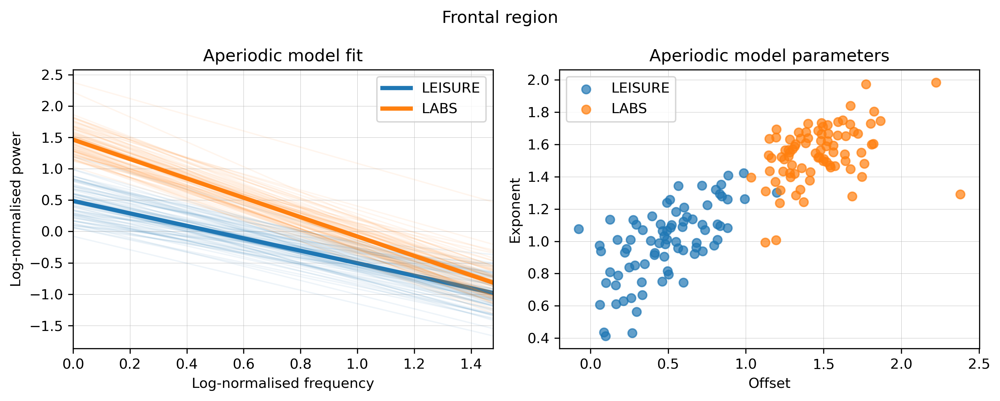

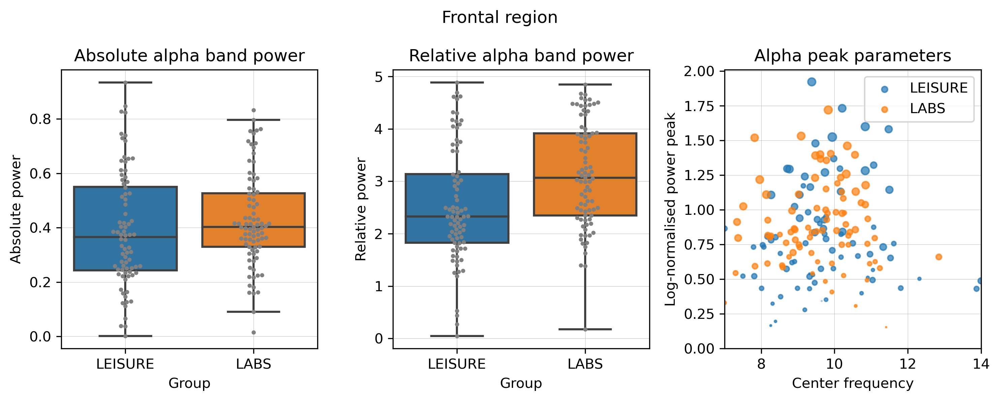

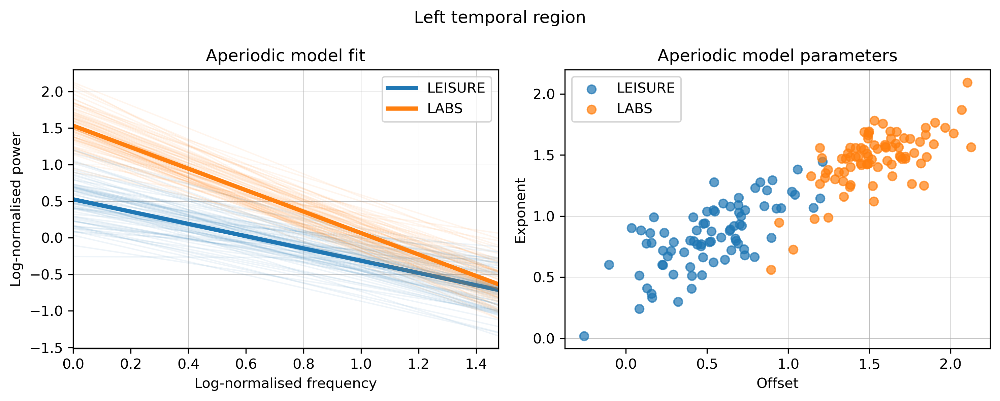

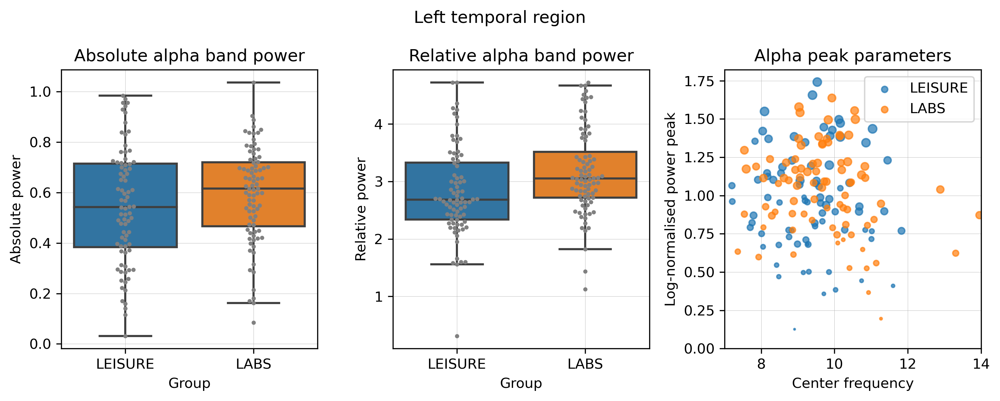

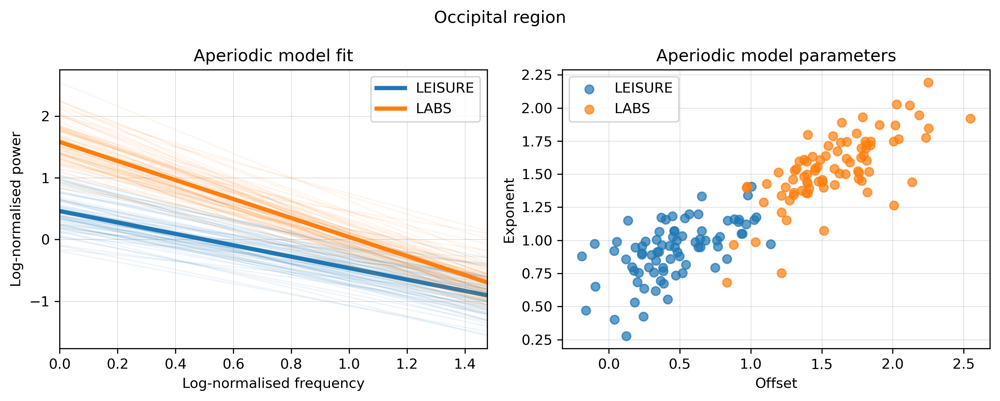

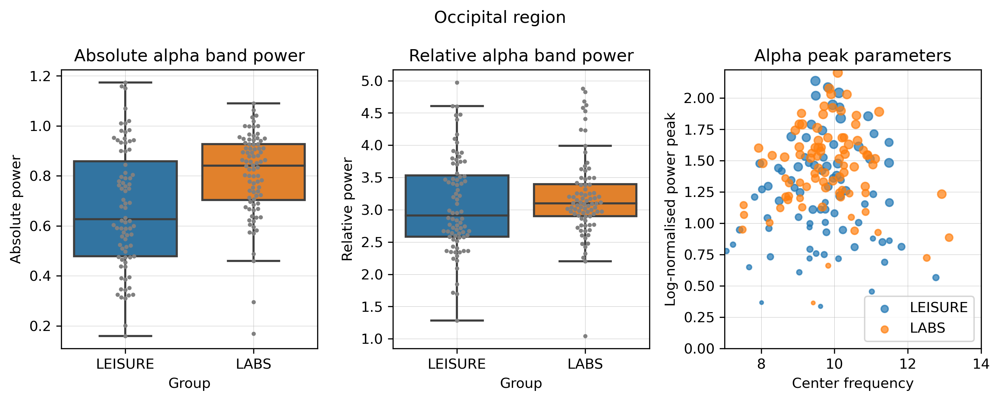

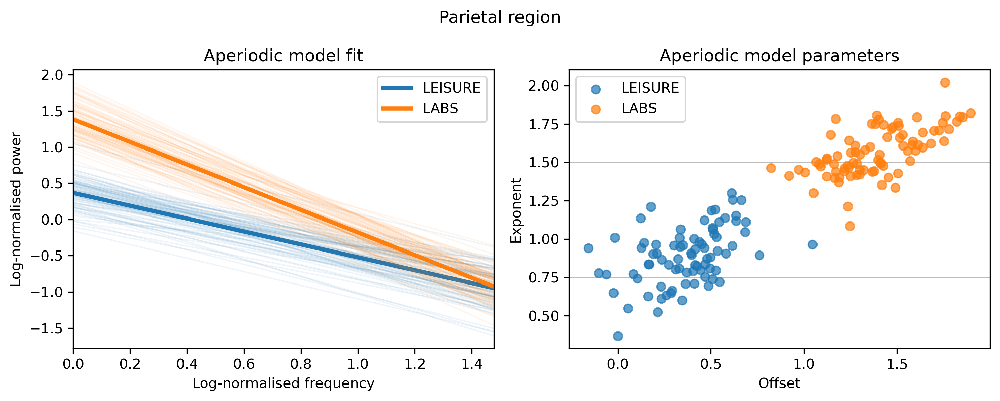

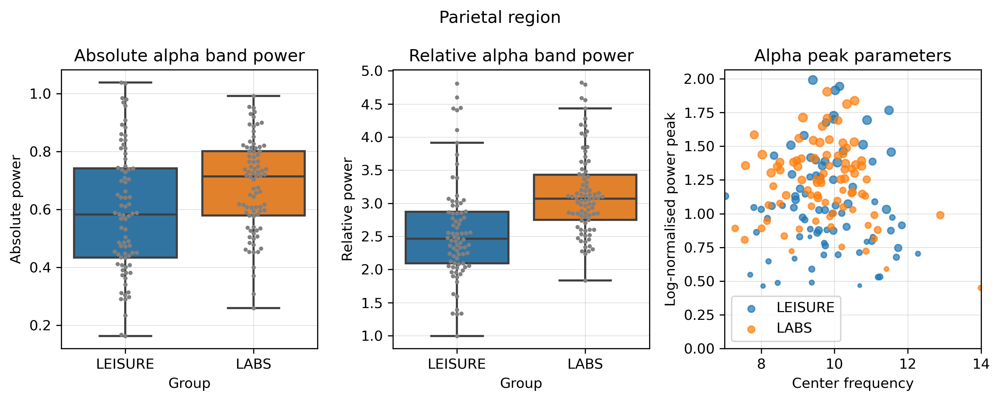

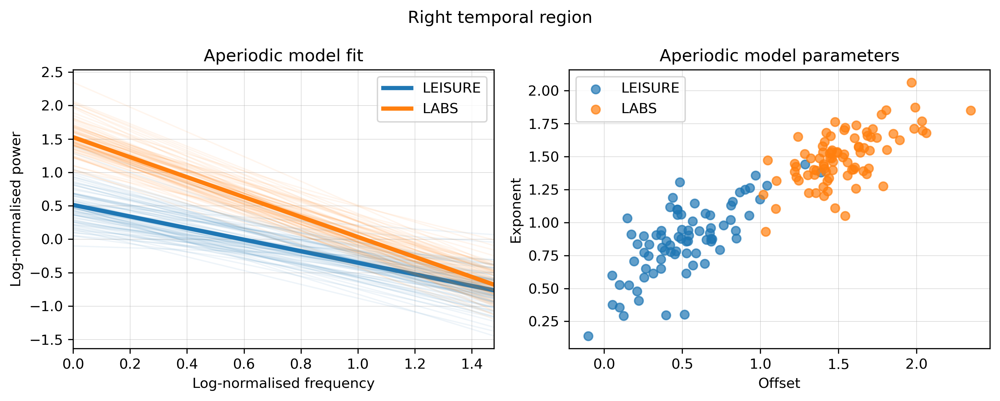

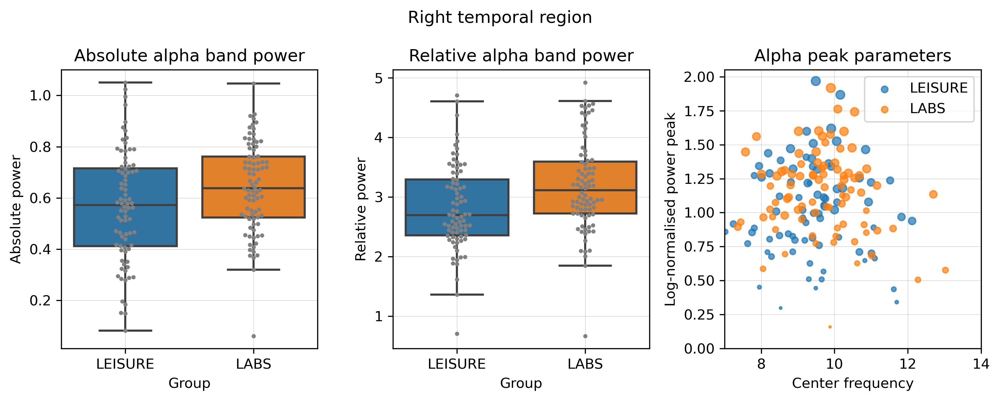

In [170]:
aps_LEISURE = [None]*5
aps_LABS = [None]*5
op_LEISURE = [None]*6
op_LABS = [None]*6

# Set plot styles
aperiodicfit_kwargs = {'linewidth' : 1, 'alpha' : 0.075}
aperiodicparams_kwargs = {'marker' : '.'}
swarm_kwargs = {'color' : 'gray', 'edgecolor' : 'black', 'size' : 3}

for i, region in enumerate(df_wo_bads['Region'].unique()):
    
    ### PLOT 1: aperiodic activity
    
    # Take only the region of interest for the aperiodic parameters in the df
    df_aps = df_wo_bads[['Offset','Exponent','Group']][df_wo_bads['Region']==region]

    # Convert the offset and exponent for both groups to 2D arrays
    aps_LEISURE[i] = df_aps[df_aps['Group']=='LEISURE'].drop(columns='Group').values
    aps_LABS[i] = df_aps[df_aps['Group']=='LABS'].drop(columns='Group').values

    # Plot aperiodic model fit in log-log scale and aperiodic parameters
    fig, axs = plt.subplots(nrows=1, ncols=2, figsize=(10, 4), dpi=300)
    plot_aperiodic_fits([aps_LEISURE[i], aps_LABS[i]], log_freqs=True,
                        ax=axs[0], freq_range=freq_range, plot_style=None,
                        labels=exp_condition, **aperiodicfit_kwargs)
    axs[0].grid(linewidth=0.2)
    axs[0].set_xlabel('Log-normalised frequency')
    axs[0].set_ylabel('Log-normalised power')
    if plot_titles==True: (axs[0].set_title('Aperiodic model fit'))
    axs[0].legend()
    plot_aperiodic_params([aps_LEISURE[i], aps_LABS[i]], ax=axs[1],
                          plot_style=None, labels=exp_condition,
                          **aperiodicparams_kwargs)
    axs[1].grid(linewidth=0.2)
    axs[1].set_xlabel('Offset')
    axs[1].set_ylabel('Exponent')
    if plot_titles==True: (axs[1].set_title('Aperiodic model parameters'))
    axs[1].legend()
    plt.suptitle('{} region'.format(region))
    plt.tight_layout()
    if savefig == True:
        plt.savefig(fname='{}/{}_aperiodic_plot.png'.format(savefinal_folder,
                                                            region))
    plt.show()

    ### PLOT 2: alpha activity

    # Take only the region of interest for the oscillatory peak in the df
    df_op = df_wo_bads[['Alpha CF', 'Alpha PW', 'Alpha absolute power',
                        'Group']][df_wo_bads['Region']==region]

    # Convert the alpha CF, PW, absolute and relative powers for both groups to 2D arrays
    op_LEISURE[i] = df_op[df_op['Group']=='LEISURE'].drop(columns='Group').values
    op_LABS[i] = df_op[df_op['Group']=='LABS'].drop(columns='Group').values

    # Take only the region of interest for the power values in the df
    df_powers = df_wo_bads[['Alpha absolute power', 'Alpha relative power',
                            'Group']][df_wo_bads['Region']==region]

    # Plot alpha absolute and relative powers and alpha peak parameters
    fig, axs = plt.subplots(nrows=1, ncols=3, figsize=(10, 4), dpi=300)
    sns.boxplot(ax=axs[0], data=df_powers[['Alpha absolute power', 'Group']],
                x='Group', y='Alpha absolute power', showfliers = False)
    sns.swarmplot(ax=axs[0], data=df_powers[['Alpha absolute power', 'Group']],
                  x='Group', y='Alpha absolute power', **swarm_kwargs)
    axs[0].grid(linewidth=0.2)
    axs[0].set_xlabel('Group')
    axs[0].set_ylabel('Absolute power')
    if plot_titles==True: (axs[0].set_title('Absolute alpha band power'))
    sns.boxplot(ax=axs[1], data=df_powers[['Alpha relative power', 'Group']],
                x='Group', y='Alpha relative power', showfliers = False)
    sns.swarmplot(ax=axs[1], data=df_powers[['Alpha relative power', 'Group']],
                  x='Group', y='Alpha relative power', **swarm_kwargs)
    axs[1].grid(linewidth=0.2)
    axs[1].set_xlabel('Group')
    axs[1].set_ylabel('Relative power')
    if plot_titles==True: (axs[1].set_title('Relative alpha band power'))
    plot_peak_params([op_LEISURE[i], op_LABS[i]],
                     ax=axs[2], freq_range=[7, 14], plot_style=None,
                     labels=exp_condition, **aperiodicparams_kwargs)
    axs[2].grid(linewidth=0.2)
    axs[2].set_xlabel('Center frequency')
    axs[2].set_ylabel('Log-normalised power peak')
    if plot_titles==True: (axs[2].set_title('Alpha peak parameters'))
    axs[2].legend()
    plt.suptitle('{} region'.format(region))
    plt.tight_layout()
    if savefig == True:
       plt.savefig(fname='{}/{}_alpha_plot.png'.format(savefinal_folder,
                                                       region))
    plt.show()
    